<img style="float: right;" src="https://image-api.nrj.fr/https/videos.enrj.net%2Fimages%2Femissions%2F00473795.jpg" width="100%">

# Crimes in Boston

#### Dataset: https://www.kaggle.com/AnalyzeBoston/crimes-in-boston
#### I will analyse this dataset from three angles:
####  ●Type of crimes
####  ●Time
####  ●Location

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML

In [2]:
df=pd.read_csv('crime.csv',encoding = "ISO-8859-1")
df["OCCURRED_ON_DATE"]=pd.to_datetime(df["OCCURRED_ON_DATE"])
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


## About type of crimes

##### What's the most frequent crimes?

In [3]:
df6=df.groupby(df['OFFENSE_CODE_GROUP']).size().reset_index(name='Number of crimes')
df6.sort_values(by='Number of crimes',inplace=True,ascending=False)
fig = px.pie(df6, values='Number of crimes', names='OFFENSE_CODE_GROUP', title='OFFENSE_CODE_GROUP')
fig.show()

##### We can see that the most frequent crimes are Motor Vehicle Accident Response(11.6%) and Larceny/Theft (8.13%).

##### How about the crimes with shooting?

In [4]:
print("Total number of crimes:",df['INCIDENT_NUMBER'].count())
print("Number of crimes with shooting:",df['SHOOTING'].count())
print("Rate of crimes with shooting:",100*df['SHOOTING'].count()/df['INCIDENT_NUMBER'].count(),"%") 

labels = ['Crimes with shooting','Crimes without shooting']
values = [1019,319073-1019]
fig = go.Figure(data=[go.Pie(labels=labels, values=values,textinfo='label+percent',insidetextorientation='radial')])
fig.show()

is_shooting=df['SHOOTING']=='Y'
shooting=df[is_shooting]

df7= shooting.groupby(shooting["OFFENSE_CODE_GROUP"]).size().reset_index(name='Number of crimes')
df7.sort_values(by='Number of crimes',inplace=True,ascending=False)
df7.loc[df7['Number of crimes'] < 11, 'OFFENSE_CODE_GROUP'] = 'Other'

fig = px.pie(df7, values='Number of crimes', names='OFFENSE_CODE_GROUP', title='OFFENSE_CODE_GROUP')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

Total number of crimes: 319073
Number of crimes with shooting: 1019
Rate of crimes with shooting: 0.3193626536874007 %


##### In the crimes with shooting, the most commom crimes are Aggravated Assault (51.3%) and Homicide/Murder (11.9%).

## About time
#### We want to know when we have more crimes or fewer crimes? Why?

In [5]:
df1= df.groupby(df["OCCURRED_ON_DATE"].dt.date).size().reset_index(name='Number of crimes')
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scatter(x=df1["OCCURRED_ON_DATE"], y=df1["Number of crimes"], name='Number of crimes',
                         line=dict(color='blue', width=1)))
fig.add_trace(go.Scatter(x=['2015-05-15','2015-09-16','2016-08-13','2017-07-18','2018-06-12','2018-10-03'], y=[300,300,300,300,300,300], name='300',
                         line=dict(color='red', width=1,dash='dashdot')))
fig.add_trace(go.Scatter(x=['2015-05-15','2016-01-18','2017-02-08','2018-02-18','2018-10-03'], y=[230,230,230,230,230], name='230',
                         line=dict(color='green', width=1,dash='dot')))
fig.update_layout(
    title="Number of crimes by Date:",
    width=1000,
    height=600,
    xaxis_title="Date",
    yaxis_title="Number of crimes")
fig.show()

#### The shape of the image looks like a sin( ) function. It probably means that the number of crimes change regularly.

In [6]:
df2= df.groupby(df["OCCURRED_ON_DATE"].dt.month).size().reset_index(name='Number of crimes')
df2.sort_values(by='Number of crimes',inplace=True,ascending=True)
df2=df2.rename(columns={"OCCURRED_ON_DATE": "Month"})
df2=df2.replace({'Month': {1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'Jun',
                       7:'Jul',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'}})
fig = px.bar(df2, x='Month', y="Number of crimes",
              color="Number of crimes",title="Number of crimes by Month:",height=500)
fig.show()

#### It seems that there are more crimes in summer and fewer crimes in winter.
#### Maybe wear too much affects action, I guess.

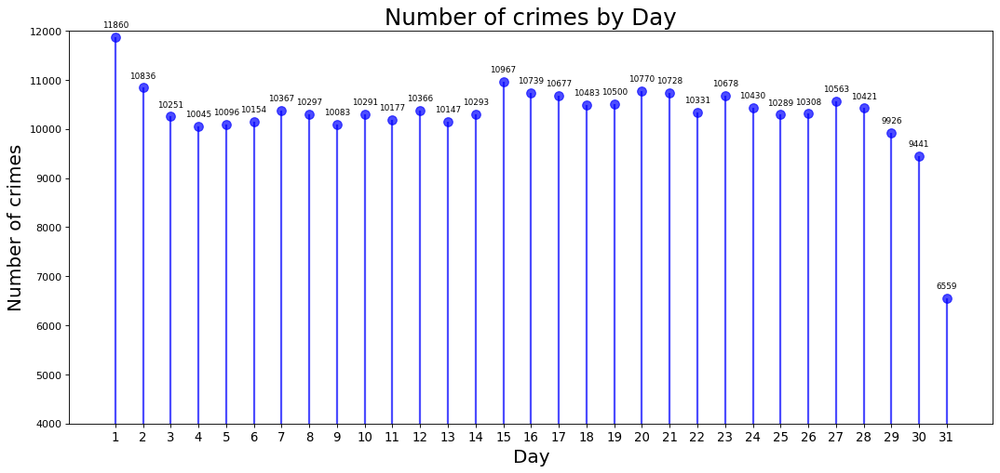

In [7]:
df3= df.groupby(df["OCCURRED_ON_DATE"].dt.day).size().reset_index(name='counts')
fig, ax = plt.subplots(figsize=(16,7), dpi= 80)
ax.vlines(x=df3.OCCURRED_ON_DATE, ymin=0, ymax=df3.counts, color='blue', alpha=0.7, linewidth=2)
ax.scatter(x=df3.OCCURRED_ON_DATE, y=df3.counts, s=75, color='blue', alpha=0.7)

ax.set_title('Number of crimes by Day', fontdict={'size':22})
ax.set_ylabel('Number of crimes',fontsize=18)
ax.set_xlabel('Day',fontsize=18)
ax.set_ylim(4000, 12000)

for i, counts in enumerate(df3["counts"]):
    ax.text(i+1, counts+200, round(counts, 1), horizontalalignment='center',fontsize=8)
plt.xticks(df3["OCCURRED_ON_DATE"], fontsize=12)
plt.show()

#### There are more crimes at 1st of a month may because of more holidays at 1st.
#### There are about half crimes at 31st  because we have half the 31st.

In [8]:
df5=df.groupby(df['HOUR']).size().reset_index(name='Number of crimes')
df5=df5.replace({'HOUR': {0:'0:00-0:59',1:'1:00-1:59',2:'2:00-2:59',3:'3:00-3:59',4:'4:00-4:59',5:'5:00-5:59',6:'6:00-6:59',7:'7:00-7:59',8:'8:00-8:59',
                          9:'9:00-9:59',10:'10:00-10:59',11:'11:00-11:59',12:'12:00-12:59',13:'13:00-13:59',14:'14:00-14:59',15:'15:00-15:59',
                          16:'16:00-16:59',17:'17:00-17:59',18:'18:00-18:59',19:'19:00-19:59', 20:'20:00-20:59',21:'21:00-21:59',22:'22:00-22:59',23:'23:00-23:59'}})
df5["HOUR"] = df5["HOUR"].values[::-1]
df5["Number of crimes"] = df5["Number of crimes"].values[::-1]
fig = px.bar(df5, x="Number of crimes", y="HOUR", orientation='h', color='Number of crimes',title="Number of crimes by Hour:",height=650)
fig.show()

#### We have fewer crimes in early morning when people are sleeping.
#### We have more crimes during 4pm to 7pm when most people get off work.

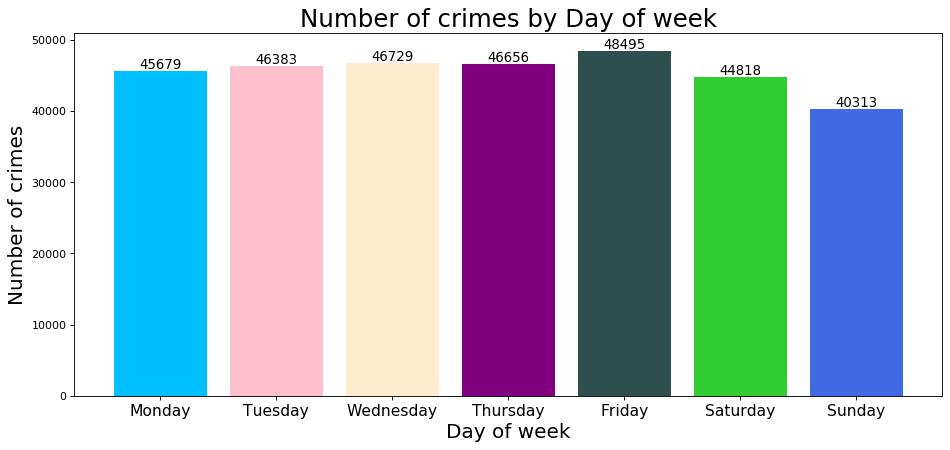

In [9]:
df4= df.groupby(df["OCCURRED_ON_DATE"].dt.weekday).size().reset_index(name='counts')

import random 
n = df3['counts'].unique().__len__()+1
all_colors = list(plt.cm.colors.cnames.keys())
random.seed(208)
c = random.choices(all_colors, k=n)

fig, ax = plt.subplots(figsize=(14,6), facecolor='white', dpi= 80)
plt.bar(df4["OCCURRED_ON_DATE"],df4["counts"],color=c,)
for i, counts in enumerate(df4["counts"]):
    ax.text(i, counts+300, round(counts, 1), horizontalalignment='center',fontsize=12)
weekday=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
plt.xticks(df4["OCCURRED_ON_DATE"],labels=weekday, fontsize=14)
ax.set_title('Number of crimes by Day of week', fontdict={'size':22})
ax.set_ylabel('Number of crimes',fontsize=18)
ax.set_xlabel('Day of week',fontsize=18)
plt.show()

## About location
#### Where is the most dagerous place?

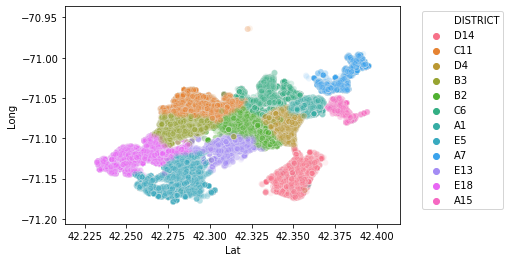

In [10]:
mask=((df['Lat']<43)&(df['Lat']>42))
df8=df[mask]
sns.scatterplot(x='Lat',y='Long',hue='DISTRICT',alpha=0.1,data=df8)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

#### We can see several districts here. But which district is most dangerous?

In [11]:
df10=df8[df8['YEAR']==2016]
df17= df10.groupby(df8["DISTRICT"]).size().reset_index(name='Number of crimes')
df16=df10.copy()
df16['Number of crimes'] =df16["DISTRICT"]
df16['Number of crimes'].replace({'A1':9829,'A15':1864,'A7':3961,'B2':14411,'B3':10551,'C11':12996,
                                     'C6':6565,'D14':5914,'D4':11675,'E13':5243,'E18':4963,'E5':3860},inplace=True)

fig = px.scatter_mapbox(df16, lat="Lat", lon="Long", hover_name="DISTRICT", hover_data=["HOUR"],
                        color_discrete_sequence=["red"], color='Number of crimes',zoom=10, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

D:\Anaconda\anaconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



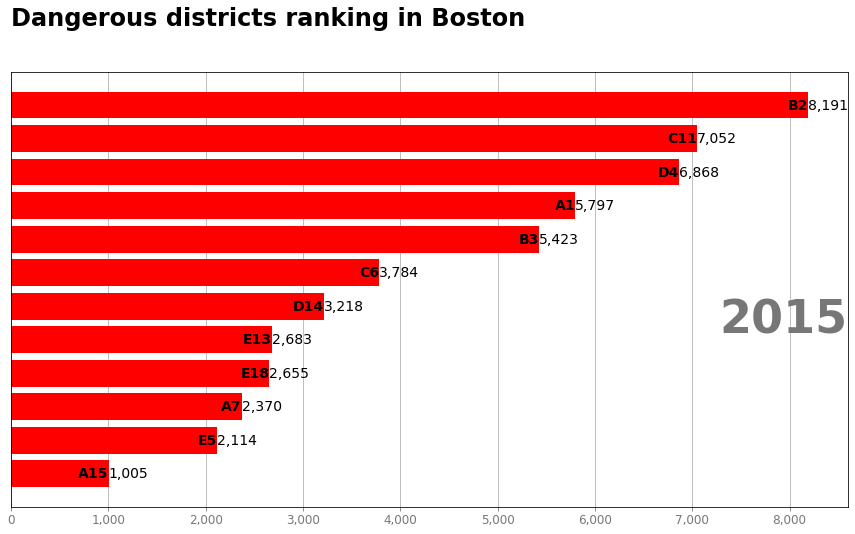

In [31]:
df11=df8[['DISTRICT','YEAR','STREET']]
df11['Number of crimes'] =1 
df11 = df11.groupby(['YEAR','DISTRICT'], as_index=False)['Number of crimes'].sum()
df11['cumsum'] = df11['Number of crimes'].groupby(df11['DISTRICT']).cumsum()

def draw_barchart(current_year):
    df12 = df11[df11['YEAR'].eq(current_year)].sort_values(by='cumsum', ascending=True).tail(12)
    
    ax.clear()
    ax.barh(df12['DISTRICT'], df12['cumsum'], color = "red")
    dx = df12['cumsum'].max()
    
    for i, (cumsum , district) in enumerate(zip(df12['cumsum'], df12['DISTRICT'])):
        ax.text(cumsum, i, district, size=14, weight=600, ha='right', va='center')
        ax.text(cumsum, i, f'{cumsum:,.0f}', size=14, ha='left',  va='center')
    
    ax.text(1, 0.4, current_year, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('bottom')
    
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.15, 'Dangerous districts ranking in Boston',
            transform=ax.transAxes, size=24, weight=600, ha='left', va='top')
    
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, frames = df11.YEAR.unique())
HTML(animator.to_jshtml())

D:\Anaconda\anaconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



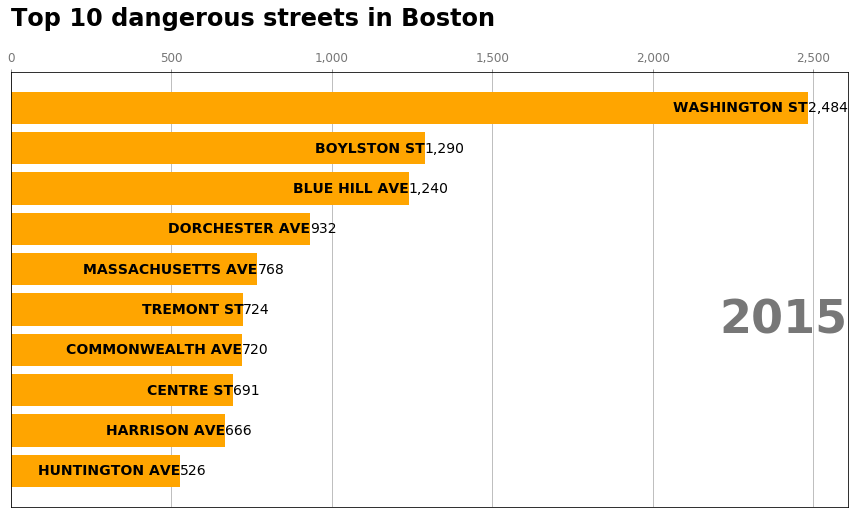

In [13]:
df14=df8[['DISTRICT','YEAR','STREET']]
df14['Number of crimes'] =1 
df14 = df14.groupby(['YEAR','STREET'], as_index=False)['Number of crimes'].sum()
df14['cumsum'] = df14['Number of crimes'].groupby(df14['STREET']).cumsum()
def draw_barchart1(current_year):
    df13 = df14[df14['YEAR'].eq(current_year)].sort_values(by='cumsum', ascending=True).tail(10)
    
    ax.clear()
    ax.barh(df13['STREET'], df13['cumsum'], color = "orange")
    dx = df13['cumsum'].max()
    
    for i, (cumsum , district) in enumerate(zip(df13['cumsum'], df13['STREET'])):
        ax.text(cumsum, i, district, size=14, weight=600, ha='right', va='center')
        ax.text(cumsum, i, f'{cumsum:,.0f}', size=14, ha='left',  va='center')
    
    ax.text(1, 0.4, current_year, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.15, 'Top 10 dangerous streets in Boston',
            transform=ax.transAxes, size=24, weight=600, ha='left', va='top')
    
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart1, frames = df14.YEAR.unique())
HTML(animator.to_jshtml())

#### If you travel to Boston someday, remember NOT to go to WASHINGTON STREET for your safety.

### Heatmap

In [14]:
df18=df16[df16['MONTH']==9]
fig = px.density_mapbox(df18, lat='Lat', lon='Long', z='Number of crimes', radius=10,
                        center=dict(lat=42.3292, lon=-71.0806), zoom=12, height=600,
                        mapbox_style="stamen-terrain")
fig.show()